In [2]:
import pandas as pd
import matplotlib.pyplot as plt
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)

In [17]:
speed_limit_data = pd.read_csv('speed_limits_filled_jan_22.csv')

speed_limit_data.head()

,tripId,vin,device,startlocaltime,endlocaltime,startlatitude,startlongitude,endlatitude,endlongitude,speed,speedMph,filedate,filetimeutc,localTimeMs,latitude,longitude,gpsspeed,road_type,road_name,speed_limit,over_speed_limit,vehicle_over_speed_limit,trip_over_speed_limit
0,10038202201014253,0f6b1f657ac30ab76519ed4c677e9909,10038,2573108,3873488,NaN,NaN,27.800831,-82.307824,20.254,45.306908,20220101,4253,2656187,27.882152,-82.334514,20.254,highway,Cannon Drive,40.0,5.306908,-3.678744,2.992495
1,10038202201014253,0f6b1f657ac30ab76519ed4c677e9909,10038,2573108,3873488,NaN,NaN,27.800831,-82.307824,15.408,34.466714,20220101,4253,2691187,27.881552,-82.330259,15.408,highway,Johanna Avenue,30.0,4.466714,-3.678744,2.992495
2,10038202201014253,0f6b1f657ac30ab76519ed4c677e9909,10038,2573108,3873488,NaN,NaN,27.800831,-82.307824,13.722,30.695240,20220101,4253,2697187,27.881310,-82.329449,13.722,highway,Johanna Avenue,25.0,5.695240,-3.678744,2.992495
3,10038202201014253,0f6b1f657ac30ab76519ed4c677e9909,10038,2573108,3873488,NaN,NaN,27.800831,-82.307824,26.134,58.460093,20220101,4253,2738687,27.876853,-82.327721,26.134,highway,US 301,45.0,13.460093,-3.678744,2.992495
4,10038202201014253,0f6b1f657ac30ab76519ed4c677e9909,10038,2573108,3873488,NaN,NaN,27.800831,-82.307824,22.283,49.845651,20220101,4253,2788187,27.868633,-82.326713,22.283,highway,US 301,45.0,4.845651,-3.678744,2.992495


In [4]:
speed_limit_data['road_type'].value_counts()

road_type
highway     173236
boundary        67
landuse         26
place            4
Name: count, dtype: int64

In [6]:
#Lets analyze the data for top 3 devices(cars)

speed_limit_data['device'].value_counts()[:3]


device
10411    7192
10075    7070
10032    5472
Name: count, dtype: int64

In [7]:
device_10411 = speed_limit_data[speed_limit_data['device'] == 10411]

#Analyzing the Speeding detail for device 10411

In [8]:
device_10411.head()

,tripId,vin,device,startlocaltime,endlocaltime,startlatitude,startlongitude,endlatitude,endlongitude,speed,speedMph,filedate,filetimeutc,localTimeMs,latitude,longitude,gpsspeed,road_type,road_name,speed_limit,over_speed_limit,vehicle_over_speed_limit,trip_over_speed_limit
9889,104112022010492341,2d5b53f80151aea5fef0722f8b1edf99,10411,33821596,36390074,NaN,NaN,27.85636,-82.672518,2.788000,6.236578,20220104,92341,120300174,27.797159,-82.300707,2.788,highway,Heritage Greens Parkway,-5.0,11.236578,7.37154,12.7305
9890,104112022010492341,2d5b53f80151aea5fef0722f8b1edf99,10411,33821596,36390074,NaN,NaN,27.85636,-82.672518,21.595000,48.306639,20220104,92341,120325674,27.794613,-82.303027,21.595,highway,Big Bend Road,30.0,18.306639,7.37154,12.7305
9891,104112022010492341,2d5b53f80151aea5fef0722f8b1edf99,10411,33821596,36390074,NaN,NaN,27.85636,-82.672518,22.315000,49.917233,20220104,92341,120370674,27.792212,-82.312054,22.315,highway,Big Bend Road,35.0,14.917233,7.37154,12.7305
9892,104112022010492341,2d5b53f80151aea5fef0722f8b1edf99,10411,33821596,36390074,NaN,NaN,27.85636,-82.672518,23.749000,53.125000,20220104,92341,120395174,27.792188,-82.317573,23.749,highway,Big Bend Road,35.0,18.125000,7.37154,12.7305
9893,104112022010492341,2d5b53f80151aea5fef0722f8b1edf99,10411,33821596,36390074,NaN,NaN,27.85636,-82.672518,23.615997,52.827481,20220104,92341,120410674,27.792191,-82.321279,23.616,highway,Big Bend Road,35.0,17.827481,7.37154,12.7305


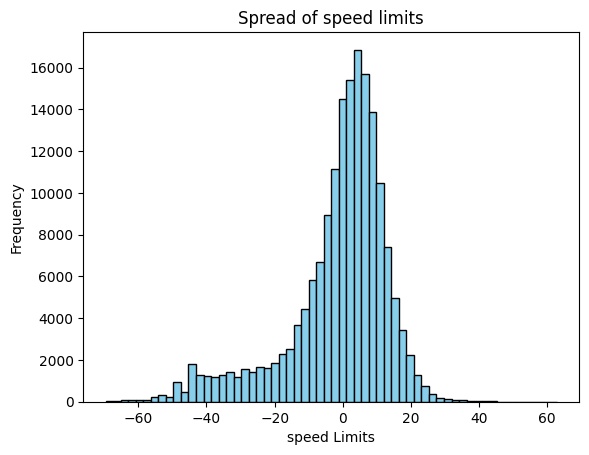

In [16]:
import matplotlib.pyplot as plt

scores = speed_limit_data['over_speed_limit']

plt.hist(scores, bins=60, color='skyblue', edgecolor='black')

plt.xlabel('speed Limits')
plt.ylabel('Frequency')
plt.title('Spread of speed limits')

plt.show()


In [18]:
avg_Over_speed_limit = abs(speed_limit_data['over_speed_limit']).mean()
print("Average speed limit of all vehicles : ", avg_Over_speed_limit)

Average speed limit of all vehicles :  10.51656168342279


we can see that on an averge most of the cars are above the speed limit by 10mph which is acceptable values

In [21]:
device_10411_over_speed_limit = abs(device_10411['over_speed_limit']).mean()
print("Average speed limit of device 10411 device : ", device_10411_over_speed_limit)

Average speed limit of device 10411 device :  13.479258739232943


A two-sample t-test is a statistical test used to determine whether there is a significant difference between the means of two independent groups. It is commonly used when you have data from two distinct groups or populations and want to compare their means to see if they are statistically different from each other.

Null Hypothesis (H0): The mean speed of device 10411 is equal to the mean speed of other devices.
Alternative Hypothesis (H1): The mean speed of device 10411 is not equal to the mean speed of other devices.

As the devices are all from the same location, it is better to compare the average speed with other devices and not equating to the specific values, as we drive with the flow of traffic

In [28]:
from scipy import stats


def compare_speed_t_test(device):

    mean_speed_over_limit_device_10411 = speed_limit_data[speed_limit_data['device'] == device]['over_speed_limit']
    mean_speed_over_limit_other_device = speed_limit_data[speed_limit_data['device'] != device]['over_speed_limit']

    t_statistic, p_value = stats.ttest_ind(mean_speed_over_limit_device_10411, mean_speed_over_limit_other_device)


    alpha = 0.05

    print("t-statistic:", t_statistic)
    print("p-value:", p_value)


    if p_value < alpha:
        print("Reject null hypothesis: The mean speeds of the device compared to rest are significantly different.")
    else:
        print("Fail to reject null hypothesis: There is not enough evidence to conclude that the mean speeds of the device compared to rest are different.")


In [31]:
device = 10411
print("Average speed above speed limit : ",abs(speed_limit_data[speed_limit_data['device'] == device]['over_speed_limit']).mean())

compare_speed_t_test(device)

Average speed above speed limit :  13.479258739232943
t-statistic: 47.202871053920894
p-value: 0.0
Reject null hypothesis: The mean speeds of the device compared to rest are significantly different.


In [32]:
device = 10075
print("Average speed above speed limit : ",abs(speed_limit_data[speed_limit_data['device'] == device]['over_speed_limit']).mean())
compare_speed_t_test(device)

Average speed above speed limit :  12.655042908495366
t-statistic: 27.403887807077837
p-value: 5.559106210383587e-165
Reject null hypothesis: The mean speeds of the device compared to rest are significantly different.


In [33]:
device = 10032
print("Average speed above speed limit : ",abs(speed_limit_data[speed_limit_data['device'] == device]['over_speed_limit']).mean())

compare_speed_t_test(device)

Average speed above speed limit :  9.932513267613308
t-statistic: -26.10213819800025
p-value: 6.735698335991076e-150
Reject null hypothesis: The mean speeds of the device compared to rest are significantly different.


In [35]:
speed_limit_data.columns

Index(['tripId', 'vin', 'device', 'startlocaltime', 'endlocaltime',
       'startlatitude', 'startlongitude', 'endlatitude', 'endlongitude',
       'speed', 'speedMph', 'filedate', 'filetimeutc', 'localTimeMs',
       'latitude', 'longitude', 'gpsspeed', 'road_type', 'road_name',
       'speed_limit', 'over_speed_limit', 'vehicle_over_speed_limit',
       'trip_over_speed_limit'],
      dtype='object')

In [2]:
acc_data = pd.read_csv('penalty_data_jan22.csv')

In [3]:
# acc_data.head()
acc_data = acc_data[['tripId','device','acceleration']]


In [4]:
sp_data = pd.read_csv('speed_limits_filled_jan_22.csv')

In [5]:
sp_data.head()

,tripId,vin,device,startlocaltime,endlocaltime,startlatitude,startlongitude,endlatitude,endlongitude,speed,speedMph,filedate,filetimeutc,localTimeMs,latitude,longitude,gpsspeed,road_type,road_name,speed_limit,over_speed_limit,vehicle_over_speed_limit,trip_over_speed_limit
0,10038202201014253,0f6b1f657ac30ab76519ed4c677e9909,10038,2573108,3873488,NaN,NaN,27.800831,-82.307824,20.254,45.306908,20220101,4253,2656187,27.882152,-82.334514,20.254,highway,Cannon Drive,40.0,5.306908,-3.678744,2.992495
1,10038202201014253,0f6b1f657ac30ab76519ed4c677e9909,10038,2573108,3873488,NaN,NaN,27.800831,-82.307824,15.408,34.466714,20220101,4253,2691187,27.881552,-82.330259,15.408,highway,Johanna Avenue,30.0,4.466714,-3.678744,2.992495
2,10038202201014253,0f6b1f657ac30ab76519ed4c677e9909,10038,2573108,3873488,NaN,NaN,27.800831,-82.307824,13.722,30.695240,20220101,4253,2697187,27.881310,-82.329449,13.722,highway,Johanna Avenue,25.0,5.695240,-3.678744,2.992495
3,10038202201014253,0f6b1f657ac30ab76519ed4c677e9909,10038,2573108,3873488,NaN,NaN,27.800831,-82.307824,26.134,58.460093,20220101,4253,2738687,27.876853,-82.327721,26.134,highway,US 301,45.0,13.460093,-3.678744,2.992495
4,10038202201014253,0f6b1f657ac30ab76519ed4c677e9909,10038,2573108,3873488,NaN,NaN,27.800831,-82.307824,22.283,49.845651,20220101,4253,2788187,27.868633,-82.326713,22.283,highway,US 301,45.0,4.845651,-3.678744,2.992495


In [6]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import TruncatedSVD
from sklearn.cluster import MiniBatchKMeans
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import plotly.express as px

In [8]:
from sklearn.cluster import KMeans

data_for_clustering = sp_data[['speedMph', 'over_speed_limit']]


kmeans = KMeans(n_clusters=3)


kmeans.fit(data_for_clustering)


cluster_labels = kmeans.labels_

# Assigning the cluster labels back to the DataFrame
sp_data['Cluster'] = cluster_labels


C:\Users\prath\AppData\Roaming\Python\Python38\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [9]:
import plotly.express as px

# Adding cluster labels to the original DataFrame
sp_data['Cluster'] = cluster_labels

# Creating the 2D scatter plot using Plotly
fig = px.scatter(sp_data, x='speedMph', y='over_speed_limit', color='Cluster', symbol='Cluster', opacity=0.8, size_max=10)
fig.update_layout(title='KMeans Clustering (n=3) of Vehicle Data',
                  xaxis_title='Speed',
                  yaxis_title='Over speed Limit')
fig.show()


In [11]:
sp_data.head()

,tripId,vin,device,startlocaltime,endlocaltime,startlatitude,startlongitude,endlatitude,endlongitude,speed,speedMph,filedate,filetimeutc,localTimeMs,latitude,longitude,gpsspeed,road_type,road_name,speed_limit,over_speed_limit,vehicle_over_speed_limit,trip_over_speed_limit,Cluster
0,10038202201014253,0f6b1f657ac30ab76519ed4c677e9909,10038,2573108,3873488,NaN,NaN,27.800831,-82.307824,20.254,45.306908,20220101,4253,2656187,27.882152,-82.334514,20.254,highway,Cannon Drive,40.0,5.306908,-3.678744,2.992495,0
1,10038202201014253,0f6b1f657ac30ab76519ed4c677e9909,10038,2573108,3873488,NaN,NaN,27.800831,-82.307824,15.408,34.466714,20220101,4253,2691187,27.881552,-82.330259,15.408,highway,Johanna Avenue,30.0,4.466714,-3.678744,2.992495,0
2,10038202201014253,0f6b1f657ac30ab76519ed4c677e9909,10038,2573108,3873488,NaN,NaN,27.800831,-82.307824,13.722,30.695240,20220101,4253,2697187,27.881310,-82.329449,13.722,highway,Johanna Avenue,25.0,5.695240,-3.678744,2.992495,0
3,10038202201014253,0f6b1f657ac30ab76519ed4c677e9909,10038,2573108,3873488,NaN,NaN,27.800831,-82.307824,26.134,58.460093,20220101,4253,2738687,27.876853,-82.327721,26.134,highway,US 301,45.0,13.460093,-3.678744,2.992495,2
4,10038202201014253,0f6b1f657ac30ab76519ed4c677e9909,10038,2573108,3873488,NaN,NaN,27.800831,-82.307824,22.283,49.845651,20220101,4253,2788187,27.868633,-82.326713,22.283,highway,US 301,45.0,4.845651,-3.678744,2.992495,0


In [14]:
# Calculate the mean of each feature within each cluster
cluster_summary = sp_data[['speedMph', 'over_speed_limit','Cluster']].groupby('Cluster').mean()

# Display the summary
print(cluster_summary)


          speedMph  over_speed_limit
Cluster                             
0        39.343266         -0.490532
1        11.520851        -19.491000
2        71.637712          8.709496


In [17]:
top_device_counts = sp_data.groupby('Cluster')['device'].value_counts().groupby(level=0).nlargest(5)

print(top_device_counts[0])

Cluster  device
0        10419     2941
         10032     2357
         10429     2076
         10075     2042
         10028     2010
Name: count, dtype: int64


In [18]:
print(top_device_counts[1])

Cluster  device
1        10419     2267
         10046     1443
         10028     1428
         10032     1425
         10075     1352
Name: count, dtype: int64


In [19]:
print(top_device_counts[2])

Cluster  device
2        10411     5042
         10075     3676
         10009     2059
         10046     1961
         10050     1908
Name: count, dtype: int64


We are looking at the different trips from a set of devices and the clusters they fall in 

Cluster 0 :- average speed and within the speed limits   
Cluster 1 :- lower speed and drives below the speed limit  
Cluster 2 :- Higher speeds and drives above the speed limit  
  
We can see there are few device Id common between Cluster 0 and 1 , which shows people are clearly seperated from lower, avergae speed and higher speed

Lets combine all the trips of a device and see if they fall in the same category of driving and this will help us understand how they vary

In [20]:
sp_data.head()

,tripId,vin,device,startlocaltime,endlocaltime,startlatitude,startlongitude,endlatitude,endlongitude,speed,speedMph,filedate,filetimeutc,localTimeMs,latitude,longitude,gpsspeed,road_type,road_name,speed_limit,over_speed_limit,vehicle_over_speed_limit,trip_over_speed_limit,Cluster
0,10038202201014253,0f6b1f657ac30ab76519ed4c677e9909,10038,2573108,3873488,NaN,NaN,27.800831,-82.307824,20.254,45.306908,20220101,4253,2656187,27.882152,-82.334514,20.254,highway,Cannon Drive,40.0,5.306908,-3.678744,2.992495,0
1,10038202201014253,0f6b1f657ac30ab76519ed4c677e9909,10038,2573108,3873488,NaN,NaN,27.800831,-82.307824,15.408,34.466714,20220101,4253,2691187,27.881552,-82.330259,15.408,highway,Johanna Avenue,30.0,4.466714,-3.678744,2.992495,0
2,10038202201014253,0f6b1f657ac30ab76519ed4c677e9909,10038,2573108,3873488,NaN,NaN,27.800831,-82.307824,13.722,30.695240,20220101,4253,2697187,27.881310,-82.329449,13.722,highway,Johanna Avenue,25.0,5.695240,-3.678744,2.992495,0
3,10038202201014253,0f6b1f657ac30ab76519ed4c677e9909,10038,2573108,3873488,NaN,NaN,27.800831,-82.307824,26.134,58.460093,20220101,4253,2738687,27.876853,-82.327721,26.134,highway,US 301,45.0,13.460093,-3.678744,2.992495,2
4,10038202201014253,0f6b1f657ac30ab76519ed4c677e9909,10038,2573108,3873488,NaN,NaN,27.800831,-82.307824,22.283,49.845651,20220101,4253,2788187,27.868633,-82.326713,22.283,highway,US 301,45.0,4.845651,-3.678744,2.992495,0


In [21]:
device_sp_data = sp_data[['device','speedMph','over_speed_limit']]

In [23]:
def custom_mean(series):
    return series.mean()

aggregated_chunks = []


aggregated_chunk = device_sp_data.groupby('device').agg({
    'speedMph': custom_mean,
    'over_speed_limit': custom_mean
}).reset_index()



print(aggregated_chunk)


   device   speedMph  over_speed_limit
0      68  40.927696          4.078269
1      70  53.026970          7.989149
2      75  62.548196          5.921690
3      77  48.642058          3.256764
4      84  47.250200          3.460602


In [26]:
from sklearn.cluster import KMeans

data_for_clustering = aggregated_chunk[['speedMph', 'over_speed_limit']]


kmeans = KMeans(n_clusters=3)


kmeans.fit(data_for_clustering)


cluster_labels = kmeans.labels_

# Assigning the cluster labels back to the DataFrame
aggregated_chunk['Cluster'] = cluster_labels


C:\Users\prath\AppData\Roaming\Python\Python38\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [27]:
import plotly.express as px

# Adding cluster labels to the original DataFrame
aggregated_chunk['Cluster'] = cluster_labels

# Creating the 2D scatter plot using Plotly
fig = px.scatter(aggregated_chunk, x='speedMph', y='over_speed_limit', color='Cluster', symbol='Cluster', opacity=0.8, size_max=10)
fig.update_layout(title='KMeans Clustering (n=3) of Vehicle Data',
                  xaxis_title='Speed',
                  yaxis_title='Over speed Limit')
fig.show()


In [28]:
# Calculate the mean of each feature within each cluster
cluster_summary = aggregated_chunk[['speedMph', 'over_speed_limit','Cluster']].groupby('Cluster').mean()

# Display the summary
print(cluster_summary)


          speedMph  over_speed_limit
Cluster                             
0        33.734654         -4.349723
1        49.222907          1.209985
2        63.281150          5.114253


In [31]:
# 10419     
# 10032    
# 10429

#Cluster 0 :- average speed and within the speed limits  

# Lets see if the devices fall into a similar cluster as clustered over trip of they fall in different cluster

print(aggregated_chunk[aggregated_chunk['device'] == 10419])
print(aggregated_chunk[aggregated_chunk['device'] == 10032])
print(aggregated_chunk[aggregated_chunk['device'] == 10429])


     device  speedMph  over_speed_limit  Cluster
105   10419  28.38346         -7.865839        0
    device   speedMph  over_speed_limit  Cluster
81   10032  42.103621         -6.455407        0
     device   speedMph  over_speed_limit  Cluster
115   10429  37.001828         -4.901574        0


We can see that all the devices based on the trip and over all trips combined fall in the same category

In [32]:
hvcan_data = pd.read_csv('first_50000_hvcan_jan.csv')

In [33]:
hvcan_data.head()

,Unnamed: 0,uuid,segmentid,partitionDate,device,timestamp,filedate,filetimeutc,updateTimeMs,sequenceNo,vin,tripId,localTimeMs,engineTorque,engineCoolantTemp,engineAtmosphericPressure,fileVersionNumber,steeringSpeed,engineSpeed,steeringTorque,epsLoad,brakePressure,torqueControlModeFast,torqueControlModeSlow,parkBrakeStatus,warnStatusAcc,dimmerCancel,passenger2Belt,passengerOccupied,rearLeftBelt,rearCenterBelt,rearRightBelt,accWarning,accLsfEngage,accLsfSubseg,accControlMode,accCmbsSetting,fuelUsed,lkasReady,lkasShowLane,cabinTemp,warnStatusParking,warnStatusCmbs,warnStatusEbd,engineIntakeAirTemp,compCurrent,fogLightRelay,engineEcompNe,airbagStatus,latAccel,accelPedalPos,cruiseOverride,cruiseEngaged,wheelVelLF,wheelVelRF,wheelVelLR,wheelVelRR,panicBrkAct,accStatus,odometerMiles,pasgSeatbelt,driverSeatbelt,pasgSeated,accSetSpeed,cruiseSetSpeed,tirePressureLF,tirePressureRF,tirePressureLR,tirePressureRR,outsideAirTemp,fogLightsOn,stabilityControlActEDR,tcuTrqConfCl2,engAccCancelReasonManual,tmDisplayedGear,absWheelSpeedFL,absWheelSpeedFR,absWheelSpeedRL,absWheelSpeedRR,timestamp_hr,updateTimeMs_hr
0,100000,1641329025818340803017,21d24f8fd7bcc5f6355f98bca2186b29,2022-01-04,3017,1641329025818,20220104,203804,1668775386333204,3408,248024541dbda1d3fd75fe49d1a4df4d,301720220104203804,74625818,6553.4,79,733.115,2,0,1214,0.0,0.0,0.0,0,0,False,False,False,False,False,False,False,False,False,False,0,False,0,265.9,False,False,0,False,False,False,0,0,False,0,False,0.0,0,False,False,0.0,0.0,0.0,0.0,False,0,127556.9,False,False,False,0.0,0.0,0,0,0,0,4.0,False,False,0,False,0,15.07,15.009999,15.07,14.9,2022-01-04 20:44:25.984,2022-11-18 12:43:06.333204102
1,100001,1641329025918340903017,21d24f8fd7bcc5f6355f98bca2186b29,2022-01-04,3017,1641329025918,20220104,203804,1668775386333207,3409,248024541dbda1d3fd75fe49d1a4df4d,301720220104203804,74625918,6553.4,79,733.115,2,0,1201,0.0,0.0,0.0,0,0,False,False,False,False,False,False,False,False,False,False,0,False,0,265.9,False,False,0,False,False,False,0,0,False,0,False,0.0,0,False,False,0.0,0.0,0.0,0.0,False,0,127556.9,False,False,False,0.0,0.0,0,0,0,0,4.0,False,False,0,False,0,15.07,15.009999,15.07,14.9,2022-01-04 20:44:25.984,2022-11-18 12:43:06.333207031
2,100002,1641329026018341003017,21d24f8fd7bcc5f6355f98bca2186b29,2022-01-04,3017,1641329026018,20220104,203804,1668775386333210,3410,248024541dbda1d3fd75fe49d1a4df4d,301720220104203804,74626018,6553.4,79,733.115,2,0,1177,0.0,0.0,0.0,0,0,False,False,False,False,False,False,False,False,False,False,0,False,0,265.9,False,False,0,False,False,False,0,0,False,0,False,0.0,0,False,False,0.0,0.0,0.0,0.0,False,0,127556.9,False,False,False,0.0,0.0,0,0,0,0,4.0,False,False,0,False,0,15.07,15.009999,15.07,14.9,2022-01-04 20:44:25.984,2022-11-18 12:43:06.333209961
3,100003,1641329026118341103017,21d24f8fd7bcc5f6355f98bca2186b29,2022-01-04,3017,1641329026118,20220104,203804,1668775386333213,3411,248024541dbda1d3fd75fe49d1a4df4d,301720220104203804,74626118,6553.4,79,733.115,2,0,1152,0.0,0.0,0.0,0,0,False,False,False,False,False,False,False,False,False,False,0,False,0,265.9,False,False,0,False,False,False,0,0,False,0,False,0.0,0,False,False,0.0,0.0,0.0,0.0,False,0,127556.9,False,False,False,0.0,0.0,0,0,0,0,4.0,False,False,0,False,0,15.07,15.009999,15.07,14.9,2022-01-04 20:44:25.984,2022-11-18 12:43:06.333212891
4,100004,1641329026218341203017,21d24f8fd7bcc5f6355f98bca2186b29,2022-01-04,3017,1641329026218,20220104,203804,1668775386333215,3412,248024541dbda1d3fd75fe49d1a4df4d,301720220104203804,74626218,6553.4,79,733.115,2,0,1170,0.0,0.0,0.0,0,0,False,False,False,False,False,False,False,False,False,False,0,False,0,265.9,False,False,0,False,False,False,0,0,False,0,False,0.0,0,False,False,0.0,0.0,0.0,0.0,False,0,127556.9,False,False,False,0.0,0.0,0,0,0,0,4.0,False,False,0,False,0,15.07,15.009999,15.07,14.9,2022-01-04 20:44:25.984,2022-11-18 12:43:06.333215088
